# Trophoblast trajectory analysis - trophoblasts; HVGs + mito genes

subsetting the data by HVGs produce the best representation of pseudotime/latent time/the differentiation trajectory of trophoblasts, and therefore will be used to assess the influence and trajectory of mitochondrial genes

In [1]:
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import scvelo as scv
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
adata = ad.read_h5ad('./yang_24.06_annotated.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 26409 × 24587
    obs: 'Author', 'BioSample', 'Run', 'Tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.14', 'leiden_res_0.10', 'leiden_res_0.09', 'cell_type', 'unique_cell_type'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'BioSample_colors', 'cell_type_colors', 'hvg', 'leiden_res_0.09', 'leiden_res_0.09_colors', 'leiden_res_0.10', 'leiden_res_0.10_colors', 'leiden_res_0.10_sizes', 

In [5]:
mitogenes = pd.read_csv("MitoCarta_genesonly.csv")["Symbol"].tolist()

In [6]:
# Create a boolean column in adata.var for mito_gene
adata.var["mito_gene"] = adata.var_names.str.split(".").str[0].isin(mitogenes)

In [7]:
trophoblasts = adata[adata.obs['cell_type'].isin(['CTB','STB','EVT'])].copy()

In [8]:
adata = trophoblasts

#### PAGA

In [9]:
sc.tl.paga(adata, groups="unique_cell_type")

<Axes: >

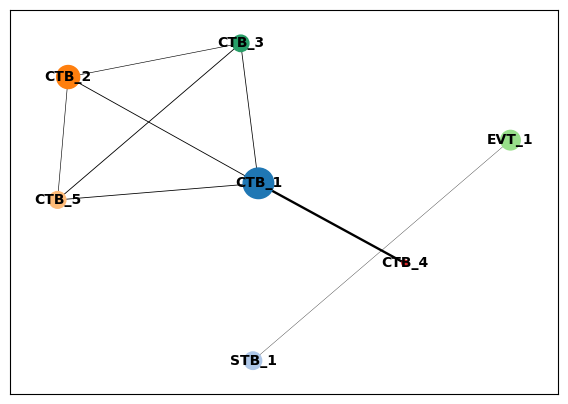

In [10]:
sc.pl.paga(adata, threshold=0.03, show=False)

In [11]:
sc.tl.draw_graph(adata, init_pos="paga")

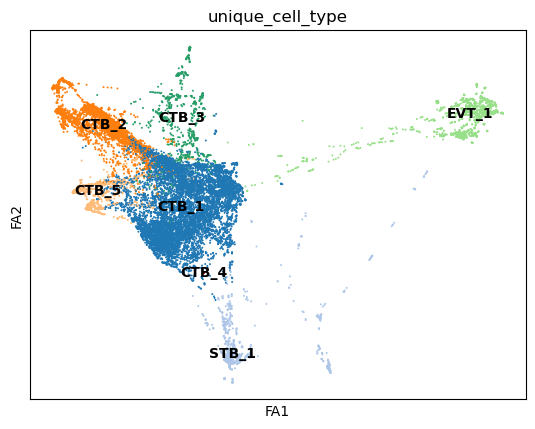

In [12]:
sc.pl.draw_graph(
    adata, color=["unique_cell_type"], legend_loc="on data"
)

#### Pseudotime

In [13]:
adata.uns["iroot"] = np.flatnonzero(adata.obs["unique_cell_type"] == "CTB_1")[0]

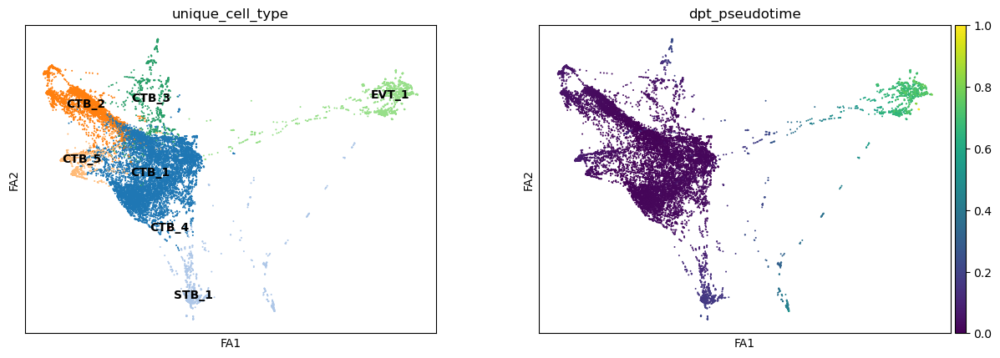

In [14]:
sc.tl.diffmap(adata)
sc.tl.dpt(adata)
sc.pl.draw_graph(adata, color=["unique_cell_type", "dpt_pseudotime"], legend_loc="on data")

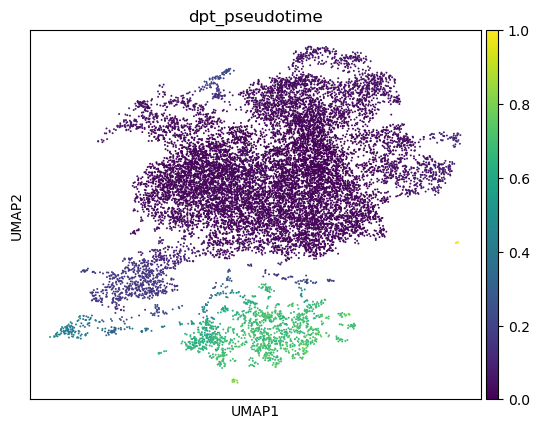

In [15]:
sc.pl.umap(adata, color='dpt_pseudotime', legend_loc='on data')
# 1 represents the most differentiated 

#### scVelo

In [16]:
scv.set_figure_params()

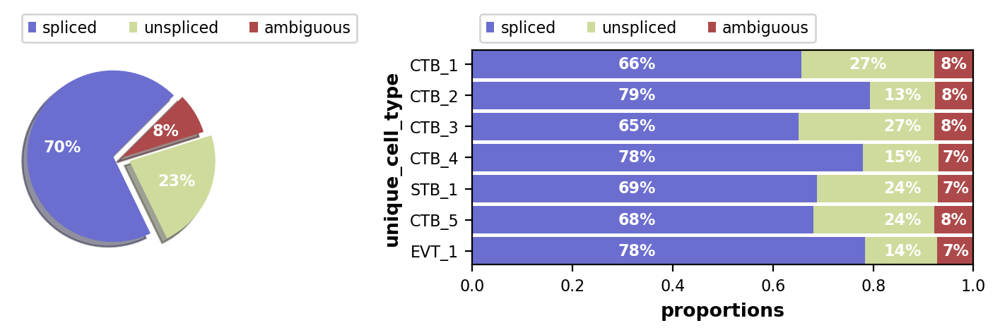

In [17]:
scv.pl.proportions(adata, groupby='unique_cell_type')

#### Filter data by HVGs and mito

Filtering by HVGs ensures accuracy for trajectory analysis; 
keeping all genes does not show clear results, resulting in trajectory arrows pointing in the reverse direction to what is biologically known;
mitochondrial genes retained for analysis

In [18]:
adata

AnnData object with n_obs × n_vars = 15051 × 24587
    obs: 'Author', 'BioSample', 'Run', 'Tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.14', 'leiden_res_0.10', 'leiden_res_0.09', 'cell_type', 'unique_cell_type', 'dpt_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mito_gene'
    uns: 'BioSample_colors', 'cell_type_colors', 'hvg', 'leiden_res_0.09', 'leiden_res_0.09_colors', 'leiden_res_0.10', 'leiden_res_0.10_col

In [19]:
mito_gene_list = adata.var_names[adata.var['mito_gene']].tolist()

In [20]:
scv.pp.filter_genes_dispersion(adata, retain_genes=mito_gene_list)

Extracted 2342 highly variable genes.


#### Assign mito pathways

In [21]:
mitocarta = pd.read_csv("./MitoCarta_full_transformed.csv")

In [22]:
# Create a dictionary where each gene maps to a list of pathways
gene_to_pathway_dict = mitocarta.groupby('Gene')['MitoPathway'].apply(list).to_dict()

In [23]:
# Add pathway information to the var metadata (now allows multiple pathways per gene)
adata.var['MitoPathways'] = adata.var_names.map(lambda x: gene_to_pathway_dict.get(x.split('.')[0], []))
# Check the result
adata.var[['MitoPathways']].head()

,MitoPathways
Gene,
HES4,[]
MXRA8,[]
AURKAIP1,"[Mitochondrial_central_dogma, Translation, Mit..."
CCNL2,[]
MRPL20,"[Mitochondrial_central_dogma, Translation, Mit..."


In [24]:
# 1. Define pathway names (matching the labels in MitoPathways)
pathway_names = ["OXPHOS", "OXPHOS_subunits", "OXPHOS_assembly_factors", "Complex_I", "CI_subunits", "CI_assembly_factors", 
                 "Complex_II", "CII_subunits", "CII_assembly_factors",
                 "Complex_III", "CIII_subunits", "CIII_assembly_factors",
                 "Complex_IV", "CIV_subunits", "CIV_assembly_factors",
                 "Complex_V", "CV_subunits", "CV_assembly_factors",
                 "Respirasome_assembly", "Cytochrome_C"]

In [25]:
# 2. Extract genes for each pathway
## create a dictionary where each key is a pathway name and each value is a list of genes associated with that pathway 
## finds genes in adata with the 'MitoPathways' annotation
pathway_genes = {}
for pathway in pathway_names:
    pathway_genes[pathway] = adata.var[adata.var['MitoPathways'].apply(lambda x: pathway in x)].index.tolist()
    print(f"Found {len(pathway_genes[pathway])} genes for {pathway}")

Found 156 genes for OXPHOS
Found 89 genes for OXPHOS_subunits
Found 68 genes for OXPHOS_assembly_factors
Found 59 genes for Complex_I
Found 37 genes for CI_subunits
Found 22 genes for CI_assembly_factors
Found 8 genes for Complex_II
Found 4 genes for CII_subunits
Found 4 genes for CII_assembly_factors
Found 15 genes for Complex_III
Found 9 genes for CIII_subunits
Found 6 genes for CIII_assembly_factors
Found 48 genes for Complex_IV
Found 18 genes for CIV_subunits
Found 30 genes for CIV_assembly_factors
Found 24 genes for Complex_V
Found 19 genes for CV_subunits
Found 5 genes for CV_assembly_factors
Found 4 genes for Respirasome_assembly
Found 2 genes for Cytochrome_C


#### RNA velocity

In [26]:
adata

AnnData object with n_obs × n_vars = 15051 × 2342
    obs: 'Author', 'BioSample', 'Run', 'Tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.14', 'leiden_res_0.10', 'leiden_res_0.09', 'cell_type', 'unique_cell_type', 'dpt_pseudotime', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mito_gene', 'MitoPathways'
    uns: 'BioSample_colors', 'cell_type_colors', 'hvg', 'le

In [27]:
scv.pp.moments(adata, use_rep='X_pca_harmony',n_pcs=30, n_neighbors=30, use_highly_variable=False)

Normalized count data: spliced, unspliced.
computing neighbors


/tmp/ipykernel_220334/451622553.py:1: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata, use_rep='X_pca_harmony',n_pcs=30, n_neighbors=30, use_highly_variable=False)
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(


    finished (0:00:21) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [28]:
scv.tl.velocity(adata, mode='stochastic',use_highly_variable=False)

computing velocities


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [29]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/28 cores)


  0%|          | 0/15051 [00:00<?, ?cells/s]

    finished (0:00:35) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

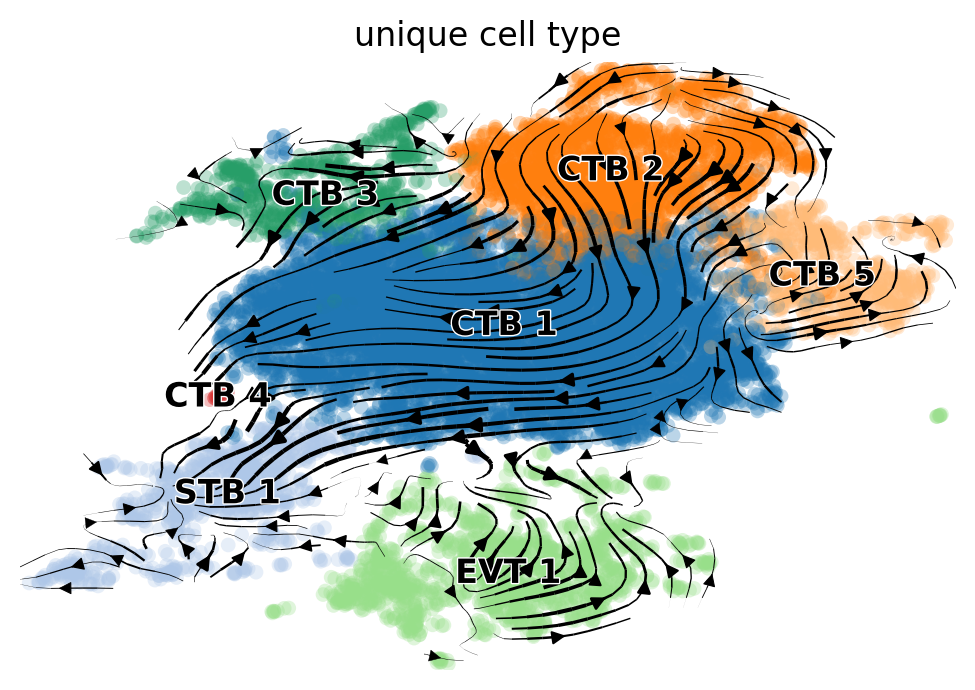

In [30]:
scv.pl.velocity_embedding_stream(adata, basis='umap',color='unique_cell_type')

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

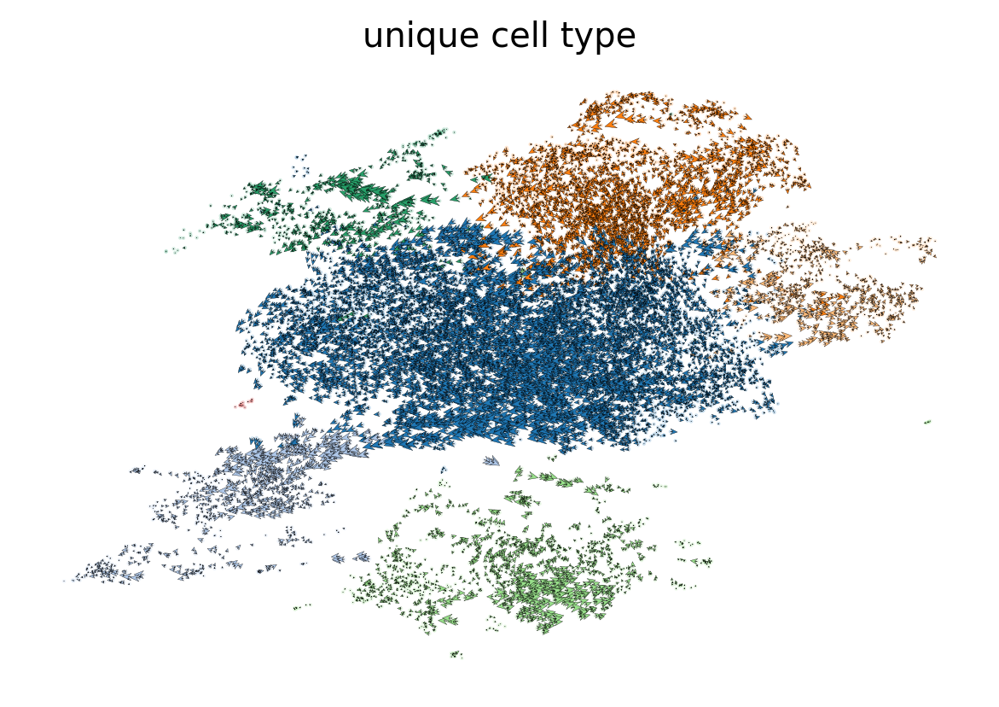

In [31]:
scv.pl.velocity_embedding(adata, arrow_length=3, arrow_size=2, dpi=120, color='unique_cell_type')

#### Speed and coherence

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

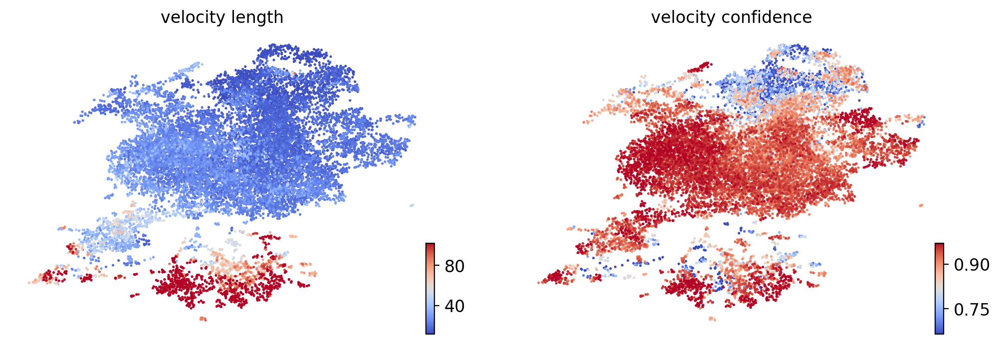

In [32]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [33]:
df = adata.obs.groupby('unique_cell_type')[list(keys)].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

unique_cell_type,CTB_1,CTB_2,CTB_3,CTB_4,STB_1,CTB_5,EVT_1
velocity_length,21.042269,14.281969,23.111040,27.765833,51.502296,19.621803,121.820129
velocity_confidence,0.926228,0.755144,0.876292,0.930082,0.902846,0.931674,0.882234


#### Velocity graph and pseudotime

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

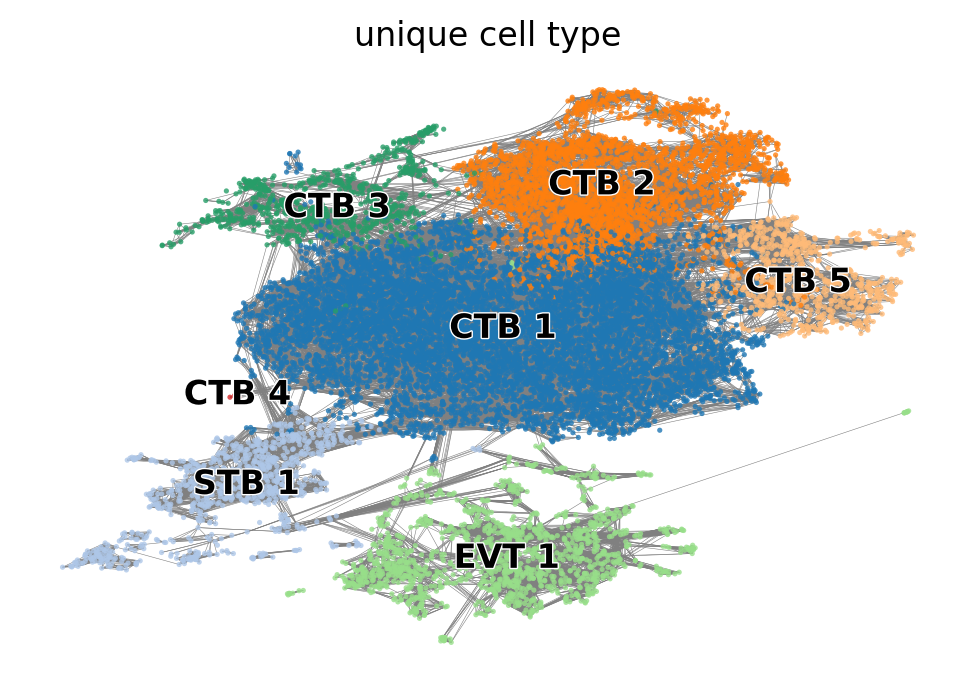

In [34]:
scv.pl.velocity_graph(adata, threshold=.1, color='unique_cell_type', legend_loc='on data')

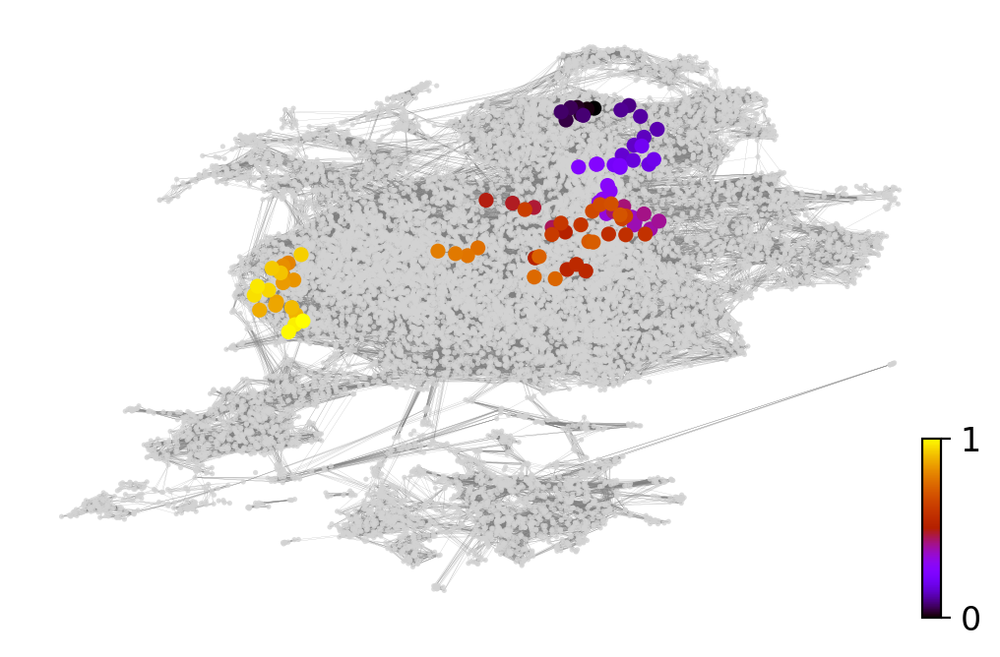

In [35]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

computing terminal states
    identified 6 regions of root cells and 2 regions of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

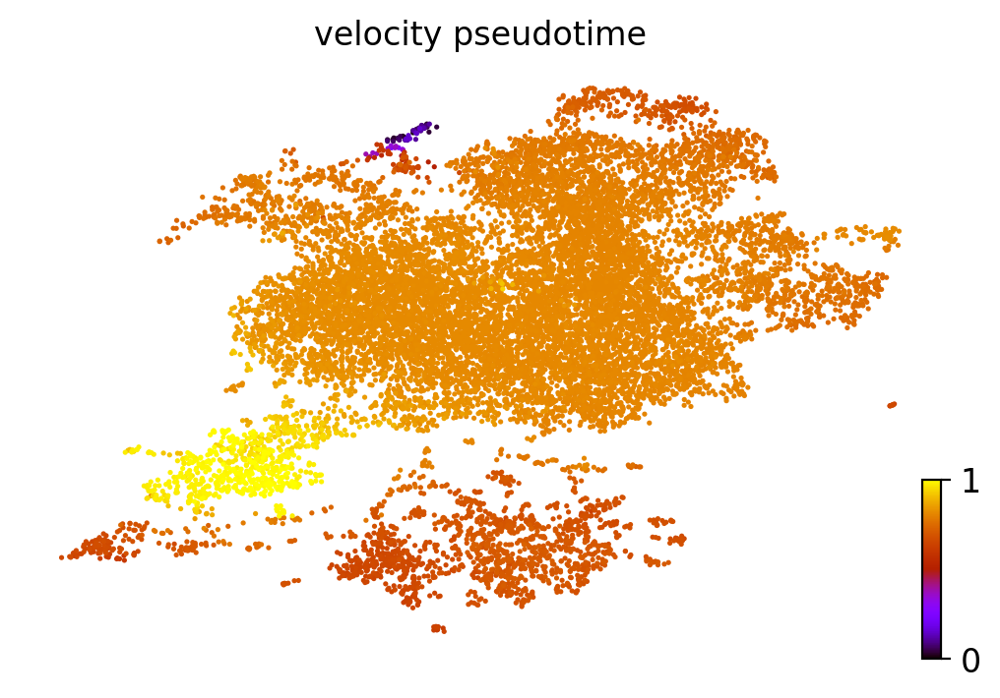

In [36]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [37]:
# scv.tl.paga(adata, groups='unique_cell_type')
# df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
# df.style.background_gradient(cmap='Blues').format('{:.2g}')

#### Dynamic model:

In [38]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/28 cores)


  0%|          | 0/548 [00:00<?, ?gene/s]

    finished (0:06:37) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [39]:
scv.tl.velocity(adata, mode='dynamical',use_highly_variable=False)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/28 cores)


  0%|          | 0/15051 [00:00<?, ?cells/s]

    finished (0:00:16) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

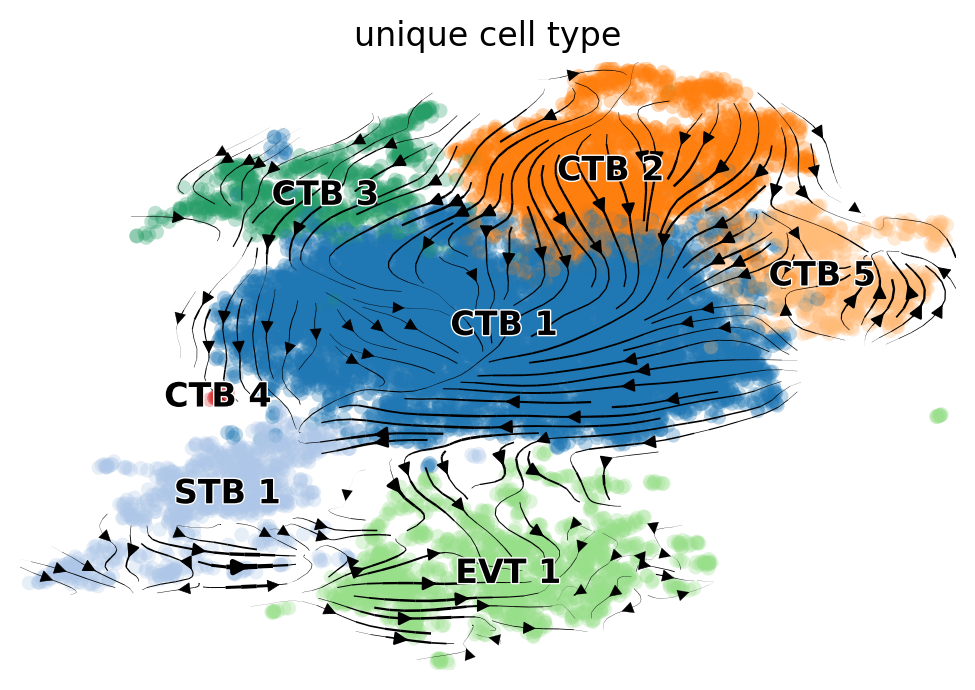

In [40]:
scv.pl.velocity_embedding_stream(adata, basis='umap',color='unique_cell_type')

#### Kinetic rate paramters:

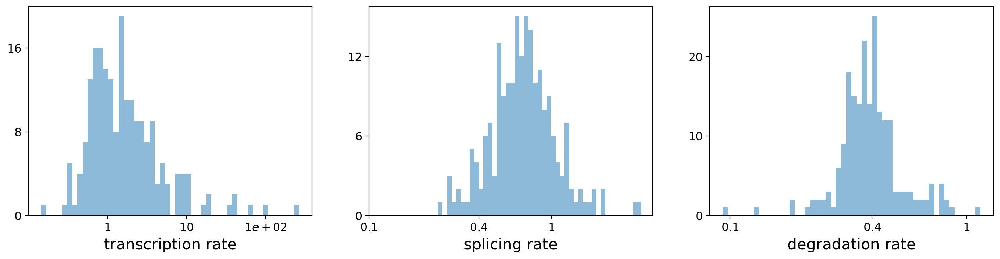

/tmp/ipykernel_220334/3438405563.py:10: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  scv.get_df(adata, 'fit*', dropna=True).head()


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Gene,,,,,,,,,,,,,,,,
ECE1,0.694408,0.453132,0.367855,3.168584,2.964110,0.331789,0.182175,7.359585e-12,0.0,0.0,0.494459,1.915324,0.644430,4.161135,1.154018,0.143835
HSPG2,2.508279,4.154998,0.368502,3.096783,0.289658,0.215544,1.172013,1.691128e-01,0.0,0.0,0.482574,0.595654,2.867416,0.635706,1.177789,0.415682
LUZP1,1.034890,1.271497,0.411788,8.370672,0.522363,0.253749,0.688580,2.996000e-01,0.0,0.0,0.418173,0.715048,1.727767,0.582020,1.930942,0.075188
TCEA3,0.400165,1.333753,0.317776,4.753328,0.443289,0.069949,0.273381,1.462097e-01,0.0,0.0,0.478398,0.272736,0.764720,0.957682,2.260512,0.028071
AL031280.1,0.276230,1.606120,0.353194,3.234338,0.478539,0.033027,0.100075,9.355158e-10,0.0,0.0,0.486728,0.170584,0.409836,3.299334,1.697911,0.165613


In [41]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

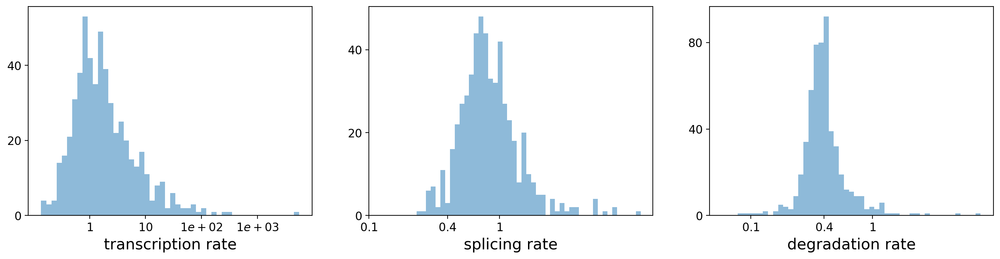

/tmp/ipykernel_220334/3086570055.py:9: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  scv.get_df(adata, 'fit*', dropna=True).head()


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Gene,,,,,,,,,,,,,,,,
ECE1,0.694408,0.453132,0.367855,3.168584,2.964110,0.331789,0.182175,7.359585e-12,0.0,0.0,0.494459,1.915324,0.644430,4.161135,1.154018,0.143835
HSPG2,2.508279,4.154998,0.368502,3.096783,0.289658,0.215544,1.172013,1.691128e-01,0.0,0.0,0.482574,0.595654,2.867416,0.635706,1.177789,0.415682
LUZP1,1.034890,1.271497,0.411788,8.370672,0.522363,0.253749,0.688580,2.996000e-01,0.0,0.0,0.418173,0.715048,1.727767,0.582020,1.930942,0.075188
TCEA3,0.400165,1.333753,0.317776,4.753328,0.443289,0.069949,0.273381,1.462097e-01,0.0,0.0,0.478398,0.272736,0.764720,0.957682,2.260512,0.028071
AL031280.1,0.276230,1.606120,0.353194,3.234338,0.478539,0.033027,0.100075,9.355158e-10,0.0,0.0,0.486728,0.170584,0.409836,3.299334,1.697911,0.165613


In [42]:
df = adata.var # not filtered for velocity gene and likelihood thresholds 

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

#### Latent time:

computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

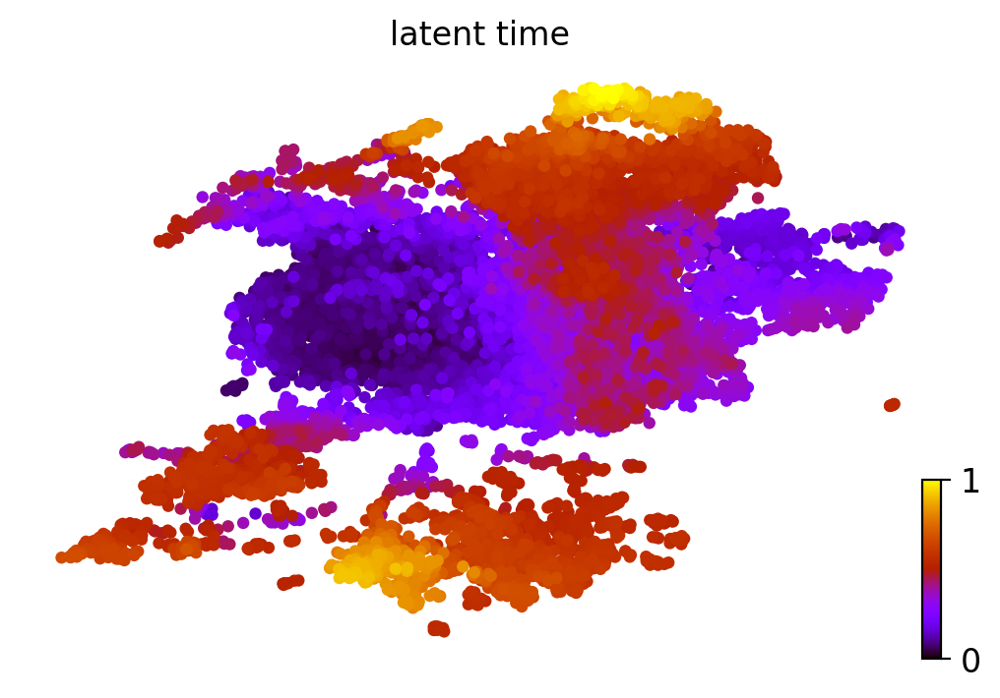

In [43]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80) 
# purple represents early stage of development; yellow represents differentiated cell 

computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

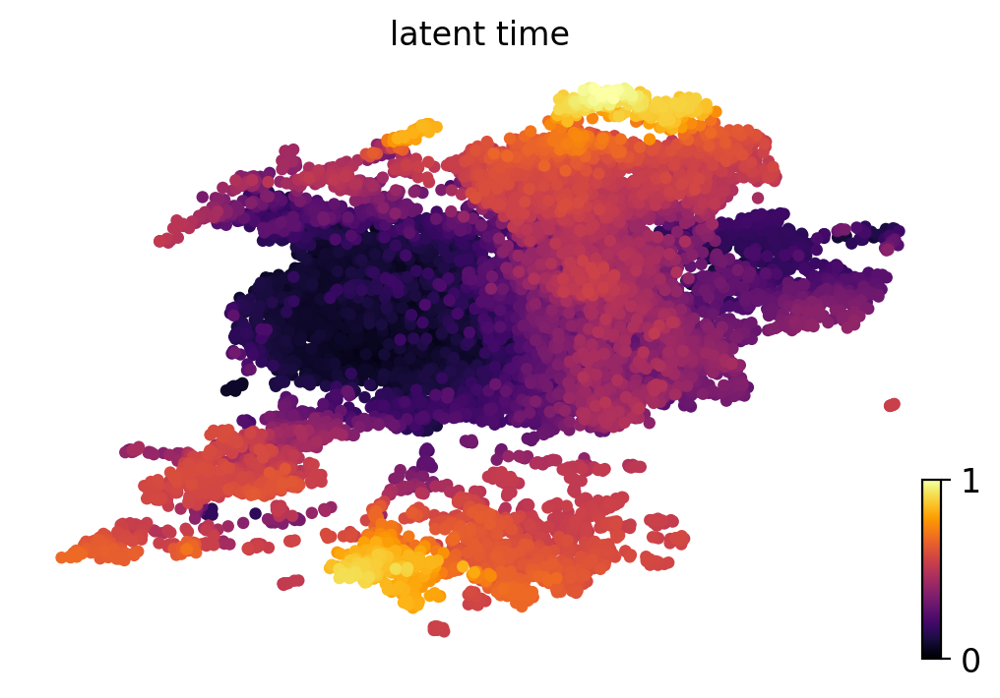

In [92]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='inferno', size=80) 
# purple represents early stage of development; yellow represents differentiated cell 

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


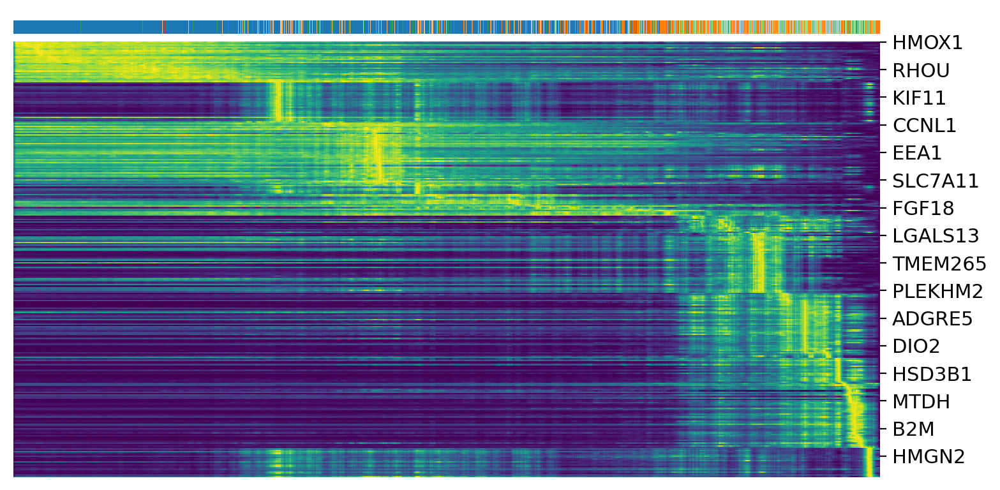

In [44]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, col_color='unique_cell_type', sortby='latent_time', n_convolve=100)

#### Velocity genes:

In [45]:
scv.tl.velocity_genes(adata)

Number of obtained velocity_genes: 548


In [46]:
adata.var[(adata.var['velocity_genes']) & (adata.var['mito_gene'])] # filtered for mito velocity genes

,Accession,Chromosome,End,Start,Strand,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,...,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Gene,,,,,,,,,,,,,,,,,,,,,
YME1L1,ENSG00000136758,10,27155266,27110112,-,False,16151,0.806381,0.591326,66.515321,...,1.003348,2.202733e-01,0.0,0.0,0.482222,1.027812,3.504060,1.074976,2.106613,0.047211
SFXN3,ENSG00000107819,10,101041244,101031234,+,False,2673,0.070884,0.068484,94.458266,...,0.194210,1.390260e-03,0.0,0.0,0.481466,0.300805,0.628965,0.452491,0.270936,0.031252
IFI27,ENSG00000165949,14,94116698,94104836,+,False,2878,1.076668,0.730765,94.033255,...,9.443195,1.166825e-11,0.0,0.0,0.499657,1.709323,22.999205,1.235816,1.346524,0.429349
CYP11A1,ENSG00000140459,15,74367646,74337759,-,False,3652,0.241676,0.216462,92.428577,...,1.211714,1.499233e-01,0.0,0.0,0.495878,0.423977,4.176405,1.138699,1.562613,0.081389
BCL2A1,ENSG00000140379,15,79971196,79960892,-,False,20681,1.595783,0.953888,57.123606,...,2.483402,8.506983e-14,0.0,0.0,0.499253,1.382012,13.697982,1.276463,1.678623,0.382217
DUT,ENSG00000128951,15,48343373,48331011,+,False,13508,0.824978,0.601568,71.994858,...,1.915642,4.228615e-02,0.0,0.0,0.498914,0.521874,5.715510,2.531434,2.452715,0.267850
PYCR1,ENSG00000183010,17,81942412,81932384,-,False,1109,0.070427,0.068058,97.700792,...,0.535486,7.367617e-12,0.0,0.0,0.487229,0.400784,1.247979,0.805524,1.127242,0.087759
FKBP10,ENSG00000141756,17,41823217,41812680,+,False,1023,0.069557,0.067244,97.879089,...,0.986250,5.057827e-03,0.0,0.0,0.498585,0.735414,3.331437,9.101118,0.687045,0.113224
CHCHD10,ENSG00000250479,22,23768443,23765834,-,False,6590,0.230335,0.207287,86.337438,...,0.317063,2.611067e-04,0.0,0.0,0.498255,0.797689,2.113572,15.790240,0.853512,0.080646


#### Top likelihood genes:

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

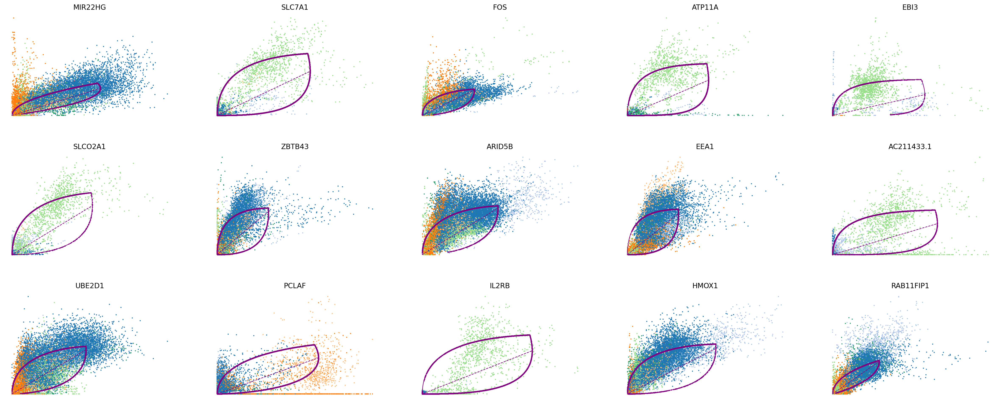

In [47]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, color='unique_cell_type', frameon=False)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

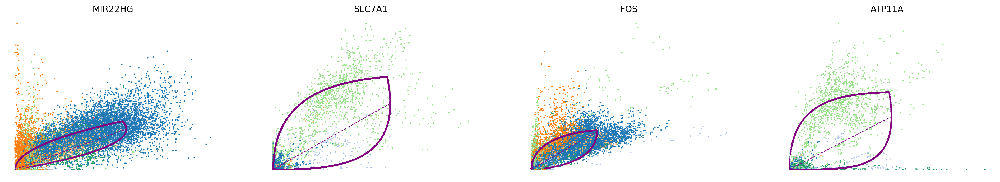

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

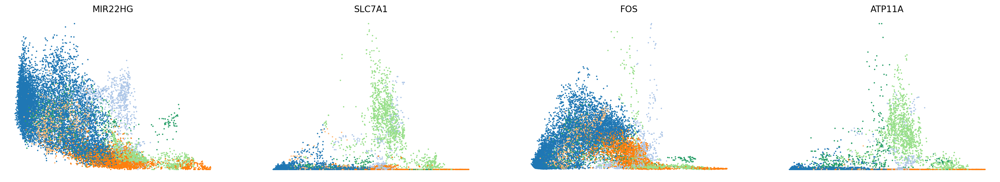

In [48]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, top_genes[:4], color='unique_cell_type', frameon=False)
scv.pl.scatter(adata, x='latent_time', y=top_genes[:4], color='unique_cell_type', frameon=False)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

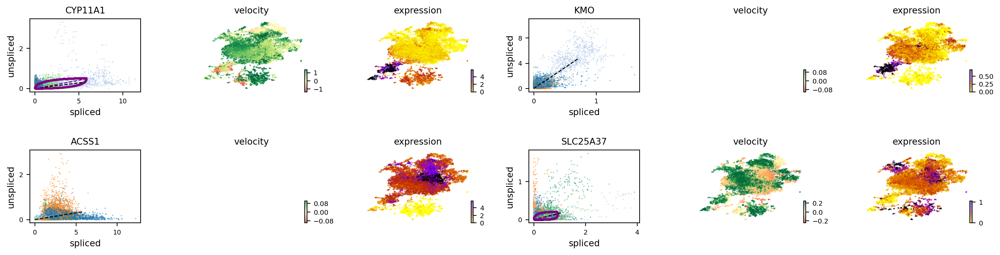

In [49]:
scv.pl.velocity(adata, ['CYP11A1',  'KMO', 'ACSS1', 'SLC25A37'], color='unique_cell_type', ncols=2)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

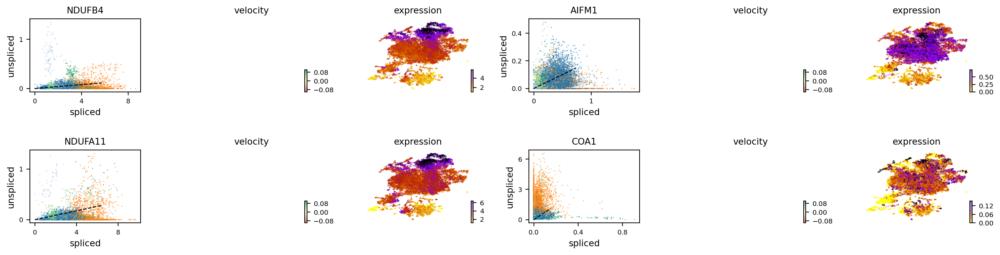

In [50]:
scv.pl.velocity(adata, ['NDUFB4',  'AIFM1', 'NDUFA11', 'COA1'], color='unique_cell_type', ncols=2)

In [51]:
adata

AnnData object with n_obs × n_vars = 15051 × 2342
    obs: 'Author', 'BioSample', 'Run', 'Tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.14', 'leiden_res_0.10', 'leiden_res_0.09', 'cell_type', 'unique_cell_type', 'dpt_pseudotime', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 

In [52]:
adata.var['velocity_mito_genes'] = adata.var['velocity_genes'] & adata.var['mito_gene']
adata.var

,Accession,Chromosome,End,Start,Strand,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,...,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2,velocity_mito_genes
Gene,,,,,,,,,,,,,,,,,,,,,
HES4,ENSG00000188290,1,1000172,998962,-,False,6881,0.363913,0.310358,85.734129,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003032,False
MXRA8,ENSG00000162576,1,1361777,1352689,-,False,1443,0.074823,0.072156,97.008334,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009046,False
AURKAIP1,ENSG00000175756,1,1375495,1373730,-,False,19557,1.348883,0.853940,59.453912,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.025500,False
CCNL2,ENSG00000221978,1,1399335,1385711,-,False,5691,0.141975,0.132759,88.201269,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.389277,False
MRPL20,ENSG00000242485,1,1407293,1401909,-,False,16568,0.872123,0.627073,65.650786,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.008579,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BGN,ENSG00000182492,X,153509546,153494980,+,False,3718,0.231351,0.208112,92.291744,...,5.458417e-29,0.0,0.0,0.497202,0.604962,2.991371,1.147232,0.410872,0.120988,False
SLC6A8,ENSG00000130821,X,153696588,153687926,+,False,6410,0.234897,0.210987,86.710619,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.050964,False
ABCD1,ENSG00000101986,X,153744755,153724856,+,False,2935,0.068354,0.066119,93.915081,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.060444,False


In [53]:
print(adata.var.index[adata.var['velocity_mito_genes']].tolist()) # 27 genes

['YME1L1', 'SFXN3', 'IFI27', 'CYP11A1', 'BCL2A1', 'DUT', 'PYCR1', 'FKBP10', 'CHCHD10', 'ATP5ME', 'ACSL1', 'SOD2', 'VARS2', 'SLC25A37', 'ADHFE1']


#### Plot mito genes on heatmap

In [54]:
# define OXPHOS genes
oxphos_genes = pathway_genes["OXPHOS"]

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


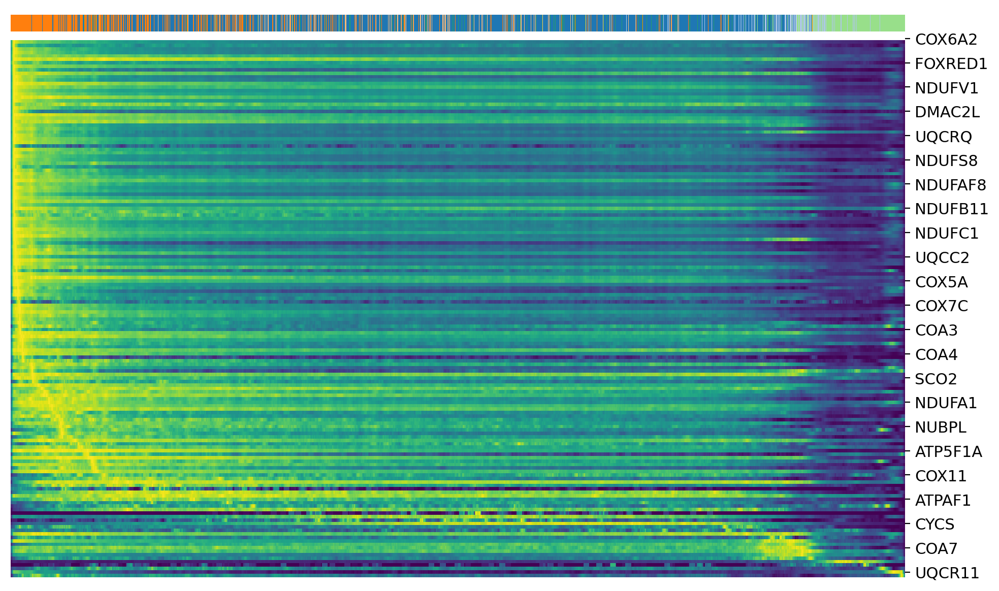

In [55]:
# Plot heatmap: expression trends of OXPHOS genes sorted by velocity length
scv.pl.heatmap(
    adata,
    var_names=oxphos_genes,
    sortby='velocity_length',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 6),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


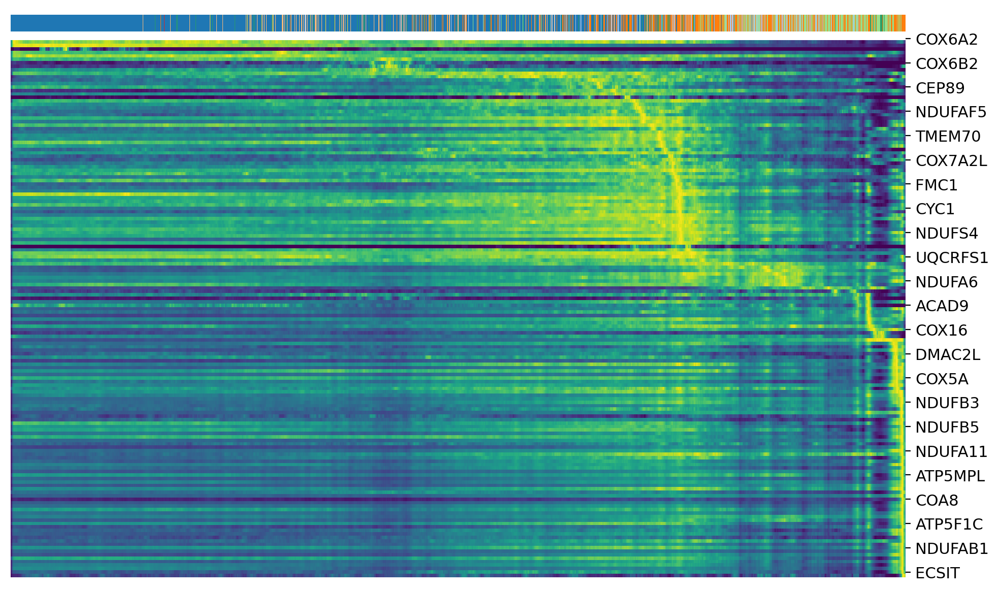

In [56]:
# Plot heatmap: expression trends of OXPHOS genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=oxphos_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 6),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


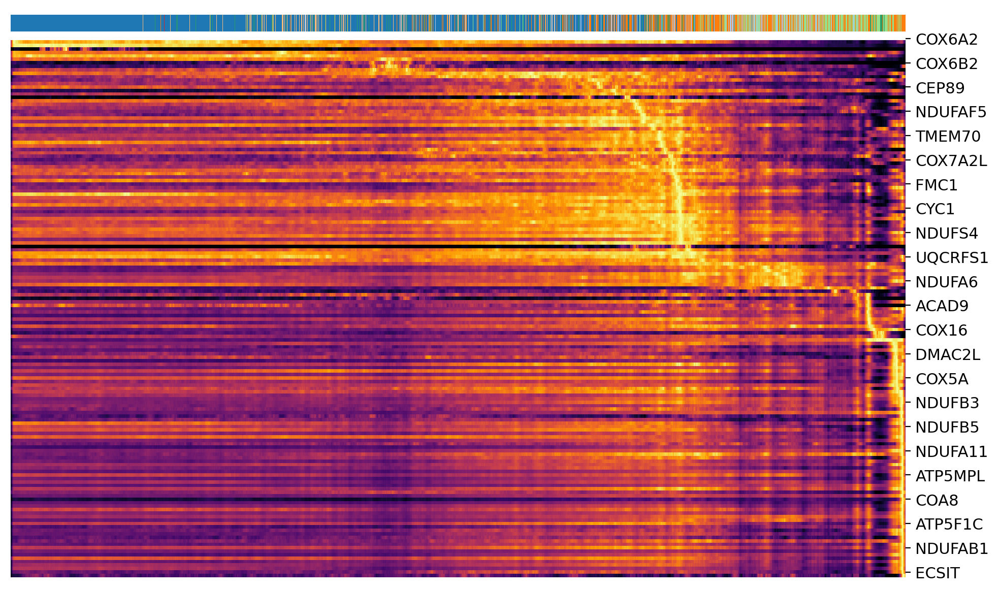

In [83]:
# colour testing
scv.pl.heatmap(
    adata,
    var_names=oxphos_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    color_map='inferno',  # PuOr_r; plasma
    figsize=(10, 6),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


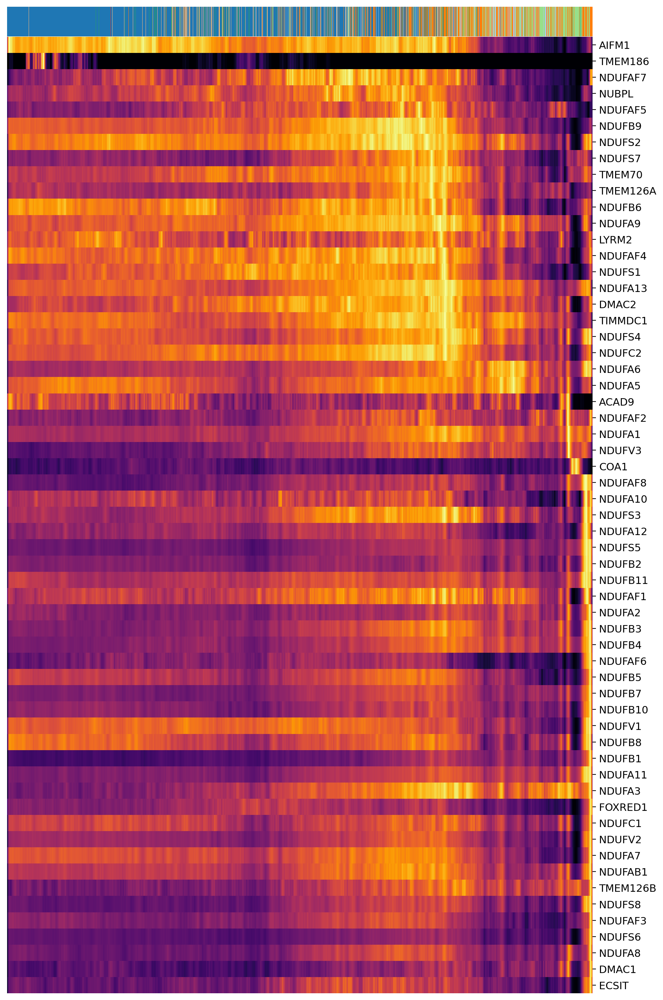

In [87]:
# Grab the CI genes
CI_genes = pathway_genes["Complex_I"]
# Plot heatmap: expression trends of CI genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CI_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    color_map='inferno',      # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 15),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


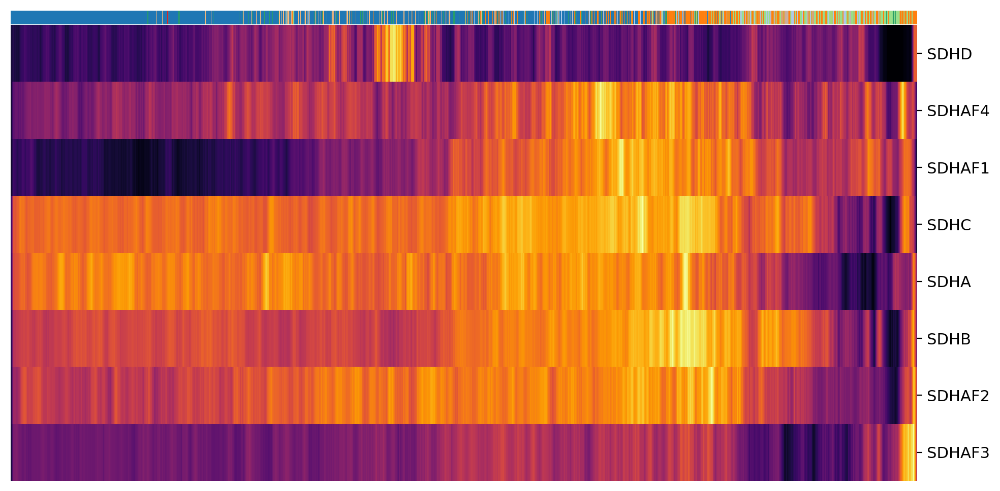

In [88]:
# Grab the CII genes
CII_genes = pathway_genes["Complex_II"]
# Plot heatmap: expression trends of CII genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CII_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    color_map='inferno',      # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 5),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


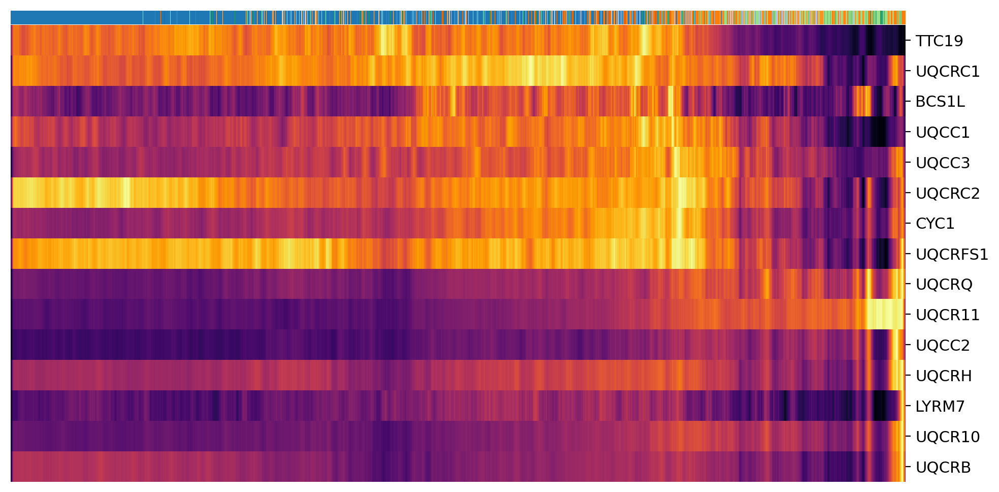

In [89]:
# Grab the CIII genes
CIII_genes = pathway_genes["Complex_III"]
# Plot heatmap: expression trends of CIII genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CIII_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    color_map='inferno',      # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 5),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


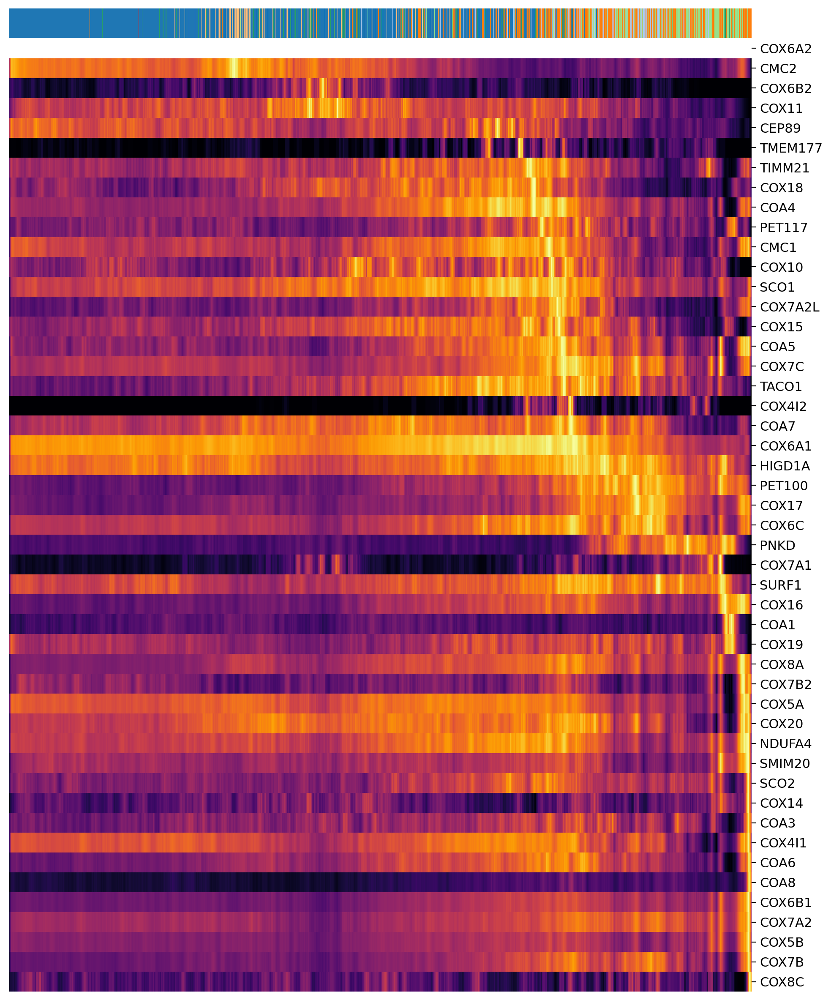

In [90]:
# Grab the CIV genes
CIV_genes = pathway_genes["Complex_IV"]
# Plot heatmap: expression trends of CIV genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CIV_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    color_map='inferno',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 12),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


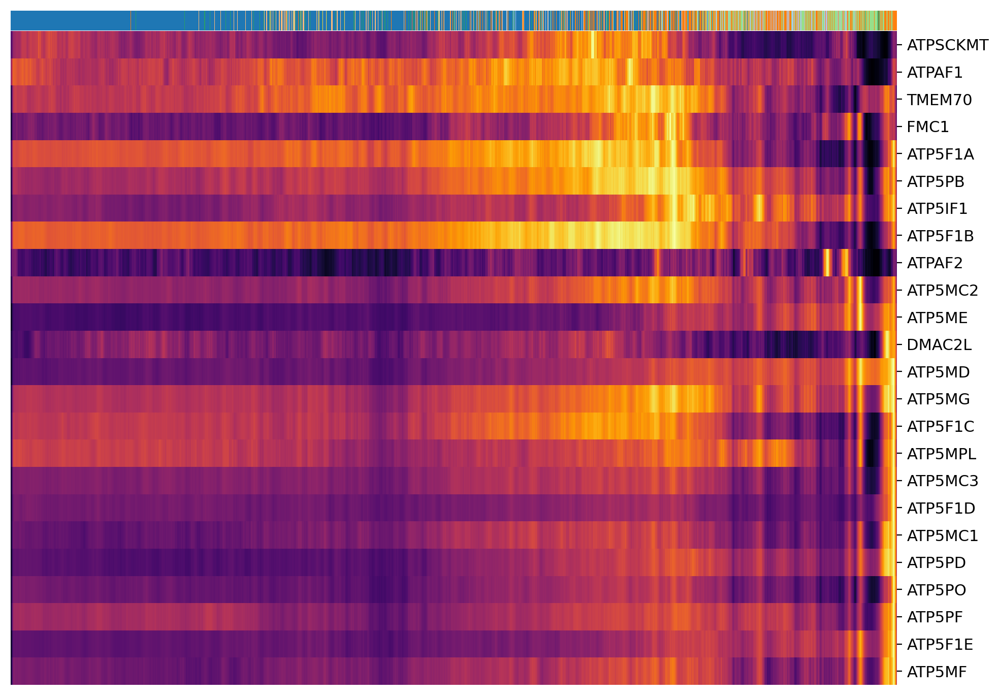

In [91]:
# Grab the CV genes
CV_genes = pathway_genes["Complex_V"]
# Plot heatmap: expression trends of CV genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CV_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    color_map='inferno',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 7),
)

In [62]:
# adata.obs.to_csv("yang.traj_obs.csv")
# adata.var.to_csv("yang.traj_var.csv")
# adata.to_df().to_csv("yang.traj_X.csv")

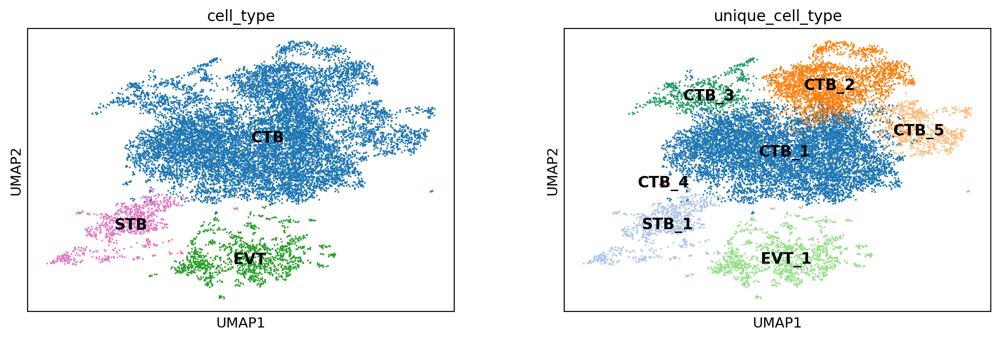

In [63]:
sc.pl.umap(adata, color=['cell_type','unique_cell_type'], legend_loc="on data")